In [143]:
import numpy as np
import pandas as pd
import matplotlib.pyplot  as plt
import skimage
%matplotlib inline

### Görüntüyü okuyup gösterme

In [144]:
image = plt.imread("./data/00194v.jpg")

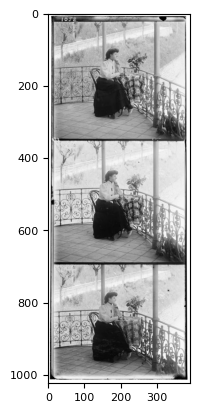

In [145]:
plt.imshow(image, cmap = 'gray')

In [146]:
image.shape #2D Veri gray scaled 2boyutlu

(1024, 393)

### Görüntüyü renk kanalları için 3'e ayırma

In [147]:
#Her bir görüntü bgr color channel den biri olarak atanip daha sonra birlestirldi

#herbirinin yuksekligi
height = image.shape[0]//3 #indiceler integer olmak zorunda 
width = image.shape[1]

#soruda renk kanallarinin sirasinin BGR olarak veriyor
B = image[:height]
G = image[height:2*height]
R = image[2*height:3*height]

print('B:', B.shape, 'G:', G.shape, 'R:', R.shape)


B: (341, 393) G: (341, 393) R: (341, 393)


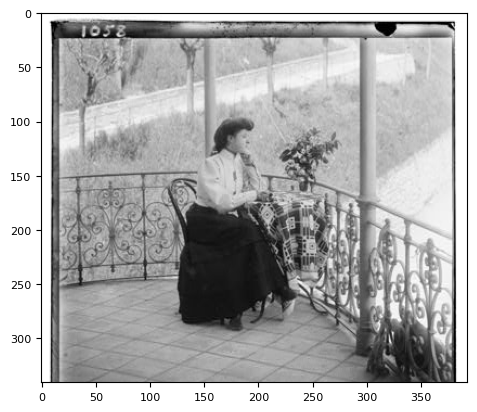

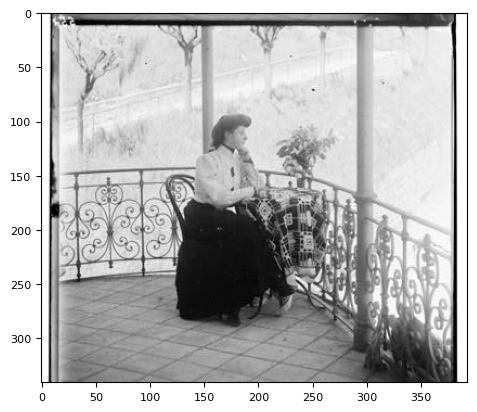

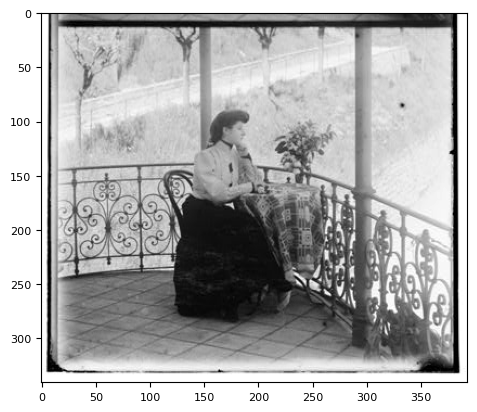

In [148]:
for i in (B, G, R):
    plt.imshow(i, cmap = 'gray')
    plt.show()

### Renkli görüntü için kanalları birleştirme

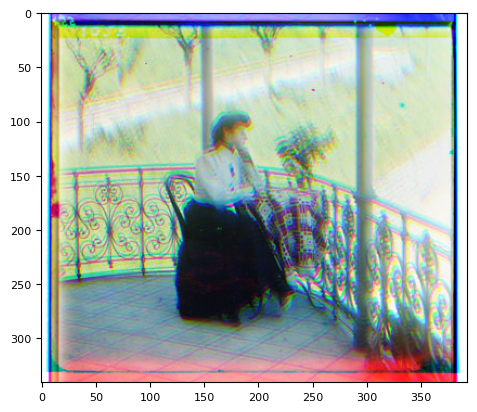

In [149]:
#Uc renk birlestiriliyor ve renkli bir goruntu ortaya cikti.
#fakat renk kanallari ustuste tam cakismadigindan goruntude kaymalar mevcut 

colored = np.stack(( R, G, B),axis=2)
plt.imshow(colored)
plt.show()

### Herbir kanalın tam olarak çakışması için kullanılan benzerlik ölçümleri

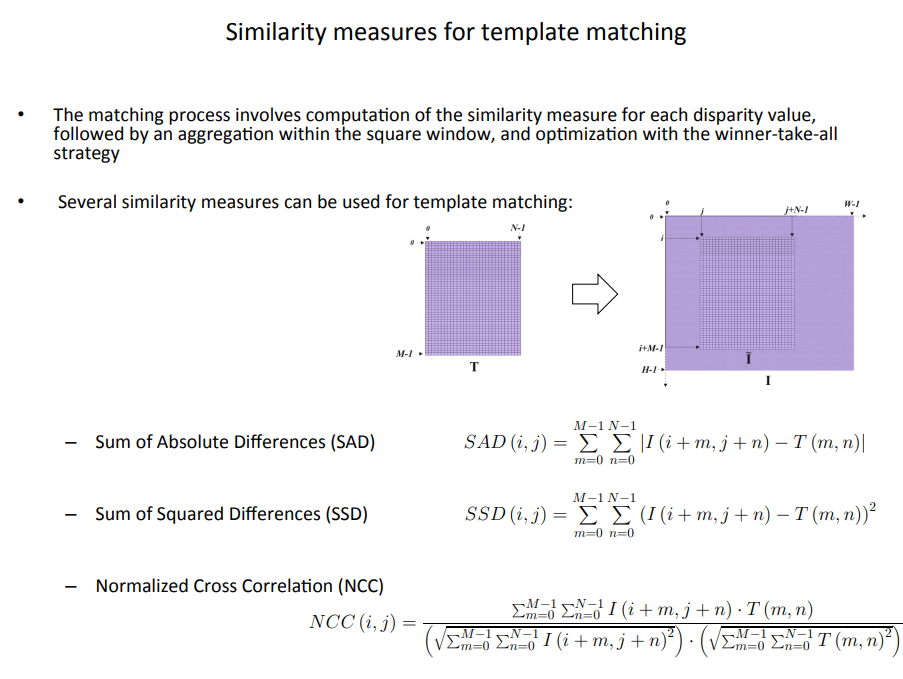

In [173]:
def cakistirma(im1, im2, method='SSD'):

    eniyi_skor = -float('inf')
    eniyi_kayma = [0, 0]
    x_kayma_sinir=(-15, 15)
    y_kayma_sinir=(-15, 15)
    
    # Her bir kayma miktarına göre SSD ve NCC degerlerine bakılarak matrix de kayma miktarı ve roll edilmil matrix elde edilir.
    for i in range(x_kayma_sinir[0], x_kayma_sinir[1] + 1):
        for j in range(y_kayma_sinir[0], y_kayma_sinir[1] + 1):
            temp_score = skor(np.roll(im1, (i, j), (0, 1)), im2, method)
            if temp_score > eniyi_skor:
                eniyi_skor = temp_score
                eniyi_kayma = [i, j]

    # yer değiştirme miktarı ve kayan matrix değeri dönderiliyor
    return np.roll(im1, eniyi_kayma, (0, 1)), np.array(eniyi_kayma)


#Blue ile Green veya Blu ile Red arasindaki pixel degerlerinin
#Sum of Square differences ya da (SSD) 
#Normalized cross-corelation(NCC) yontemleri  ile benzerlik skorlari hesaplaniyor

def skor(im1, im2, method='SSD'):
    if method == 'SSD':
        return -np.sum(np.sum((im1 - im2)**2)) 
    elif method == 'NCC':
        im1 = np.ndarray.flatten(im1)
        im2 = np.ndarray.flatten(im2)
        return np.dot(im1 / np.linalg.norm(im1), im2 / np.linalg.norm(im2))

### SSD' a göre görüntünün elde edilmesi

Green shift:  [3 2]
Red shift:  [8 4]


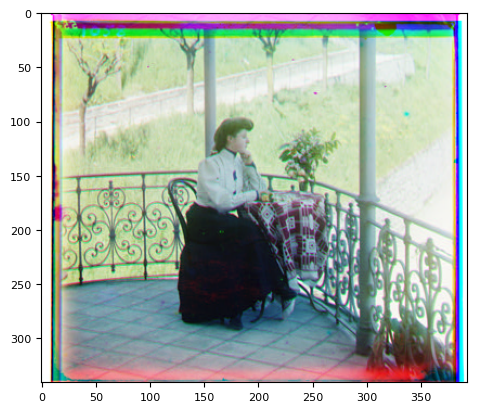

In [174]:
ag, g_shift = cakistirma(G, B)
ar, r_shift = cakistirma(R, B)

# Yeni align edilmis colored image
aligned_image = np.dstack([ar, ag, B])

print("Green shift: ", g_shift)
print("Red shift: ", r_shift)

plt.imshow(aligned_image)

###  NCC'ye göre görüntünün elde edilmesi

Green shift:  [4 2]
Red shift:  [8 3]


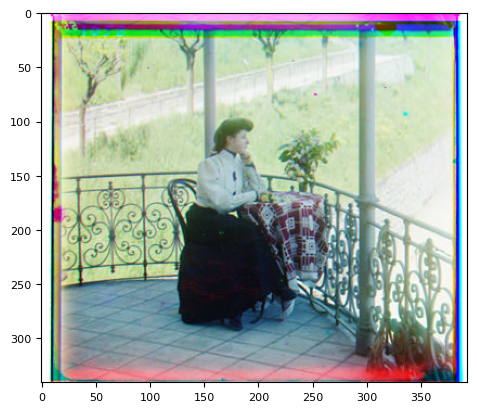

In [175]:
ag, g_shift = cakistirma(G, B, method = 'NCC')
ar, r_shift = cakistirma(R, B, method = 'NCC')

# create a color image
aligned_image = np.dstack([ar, ag, B])

print("Green shift: ", g_shift)
print("Red shift: ", r_shift)

plt.imshow(aligned_image)

### Kenarları kırpma

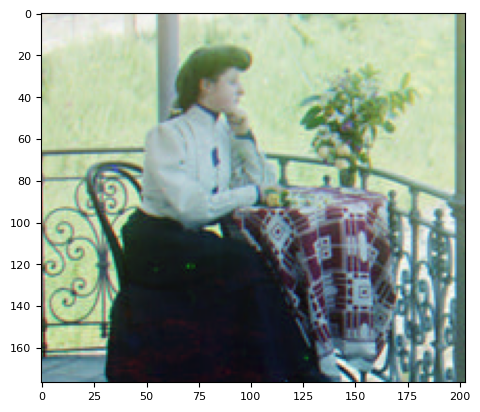

In [178]:
#Kenarlar kaydıgı için buralarda düzelmeler olmayacak.Bu sebeple kırptık

aligned_image = aligned_image[int(0.1 * len(aligned_image)):-int(0.1 * len(aligned_image)),
int(0.1 * len(aligned_image[0])):-int(0.1 * len(aligned_image[0]))]

plt.imshow(aligned_image)


### İki görüntüyü karşılaştırırken yanyana gelmesi için fonksiyon 

In [179]:
#Bundan sonra yapacagimiz filterelerde karsilastirma yaparken goruntulerin yan yana gorunmesi icin
def plot_comparison(original, filtered,   title_filtered= 'filtered image'):
    
    fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize=(12,14), sharex = True, sharey = True)
    ax1.imshow(original, cmap = plt.cm.gray)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap = plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')

### Histogram eq. ile görüntü konrastını arttırma

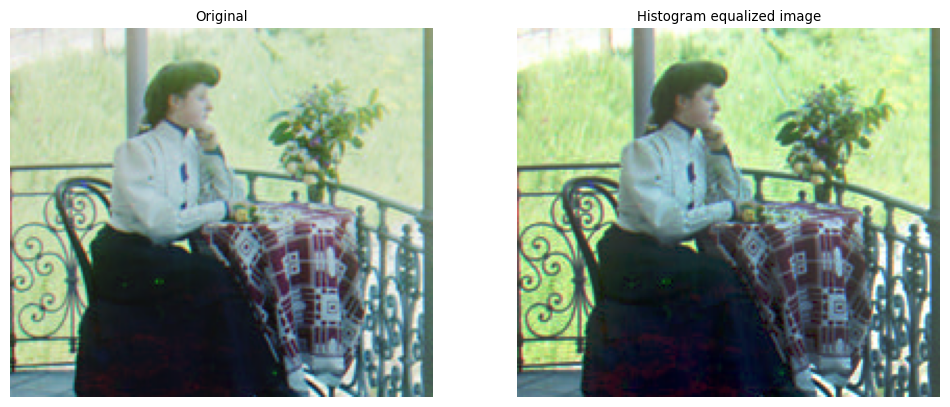

In [180]:
#Goruntu cok smooth biraz contrast yukseltmek amacıyla 
#histogram equalization uygulayıp goruntuyu  keskin hale getirdik

from skimage import exposure
image_eq = exposure.equalize_hist(aligned_image)

#Orjinal ve filtre uygulanmış halini karşılaştıralım
plot_comparison(aligned_image, image_eq, 'Histogram equalized image')

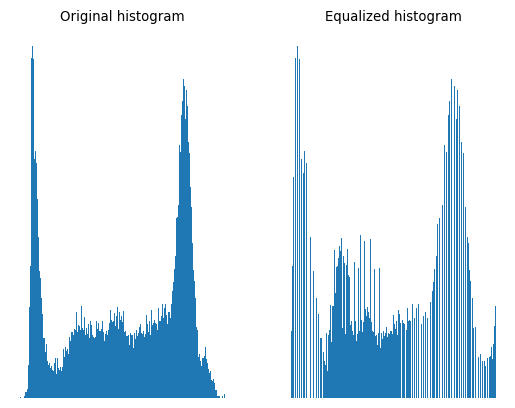

In [197]:
#histogram graph for channels

red = aligned_image[:, :, 0]
red_eq = image_eq[:, :, 0]

fig, (ax1, ax2) = plt.subplots(ncols = 2)
ax1.hist(red.ravel(),  bins= 256)
ax1.set_title('Original histogram')
ax1.axis('off')
ax2.hist(red_eq.ravel(), bins= 256)
ax2.set_title('Equalized histogram')
ax2.axis('off')
plt.show()

### Adaptive Histogram Equalization

Bölgesel kontrast degerlerinin hesaplanıp arttırmak amacıyla kullanılıyor.

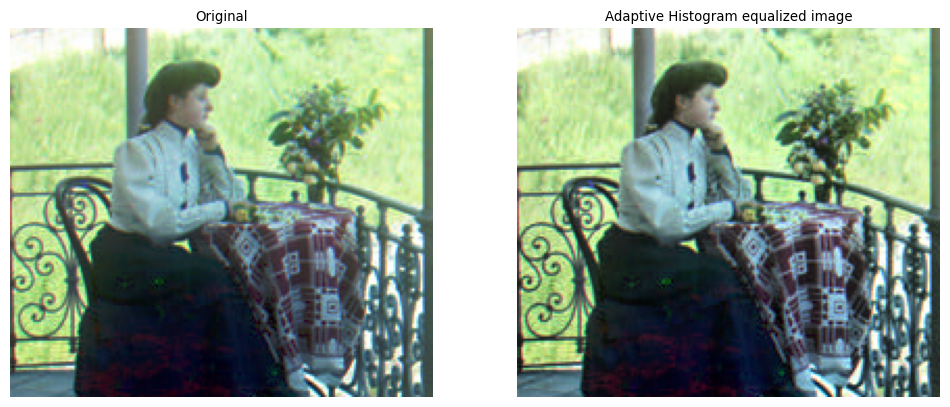

In [182]:
#Burada daha cok kucuk objelerin ve kenarlarin farkinda olmak icin kullanilabilr

from skimage import exposure
image_adapted = exposure.equalize_adapthist(image_eq, clip_limit = 0.009)
#Orjinal ve filtre uygulanmış halini karşılaştıralım
plot_comparison(image_eq, image_adapted, 'Adaptive Histogram equalized image')

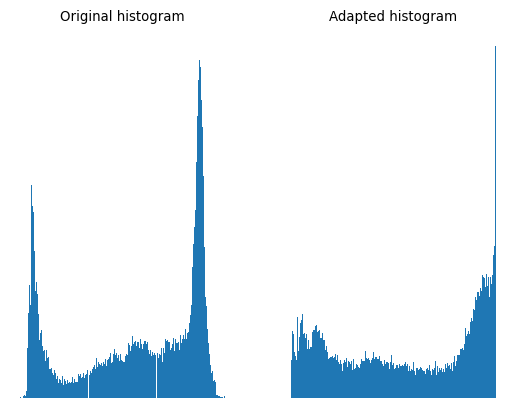

In [183]:
#Histogram of adapted image

green = aligned_image[:, :, 1]
green_eq = image_adapted[:, :, 1]

fig, (ax1, ax2) = plt.subplots(ncols = 2)
ax1.hist(green.ravel(),  bins= 256)
ax1.set_title('Original histogram')
ax1.axis('off')
ax2.hist(green_eq.ravel(), bins= 256)
ax2.set_title('Adapted histogram')
ax2.axis('off')
plt.show()

### Gamma correction
Gamma degeri 0-1 arasinda histogramda sag tarafa dogru beyazlatma
1 den yukari degerler icin koyulastirma yapmaktadır

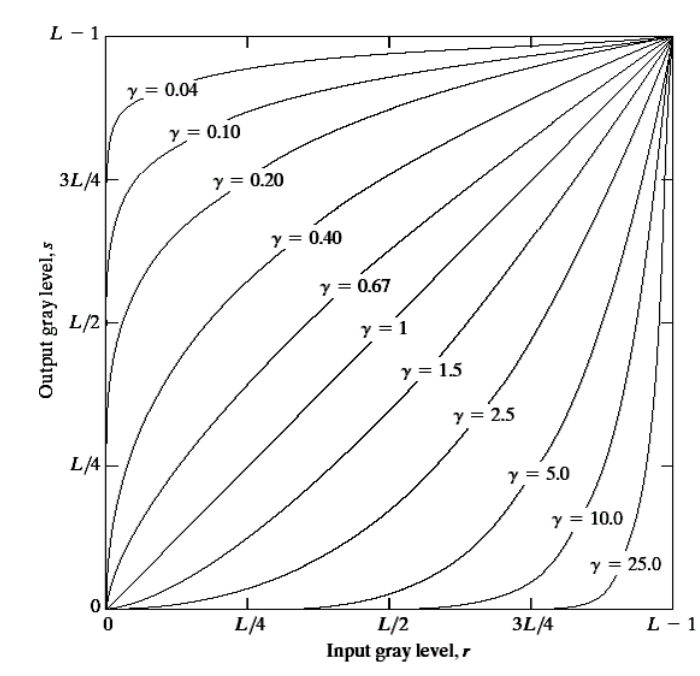

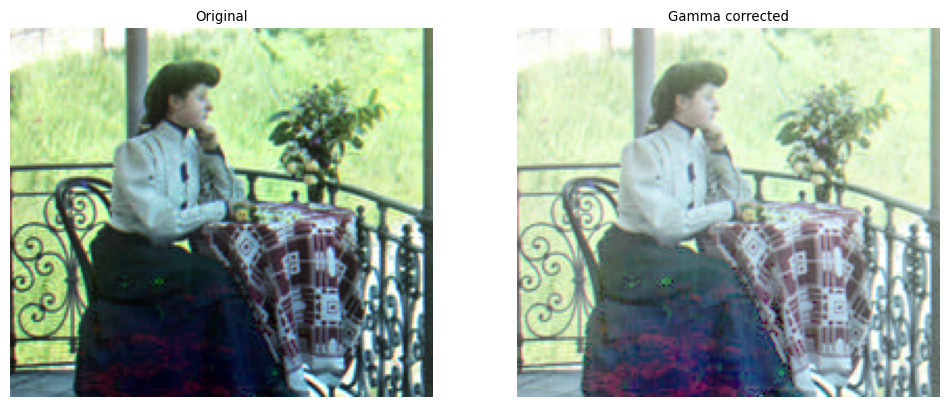

In [184]:
# Gamma correction
gamma_corrected = exposure.adjust_gamma(image_adapted, 0.5) #1 in altındaki degeler için renki actı beyaa yaklastırdı
#Orjinal ve filtre uygulanmış halini karşılaştıralım
plot_comparison(image_adapted, gamma_corrected, 'Gamma corrected')



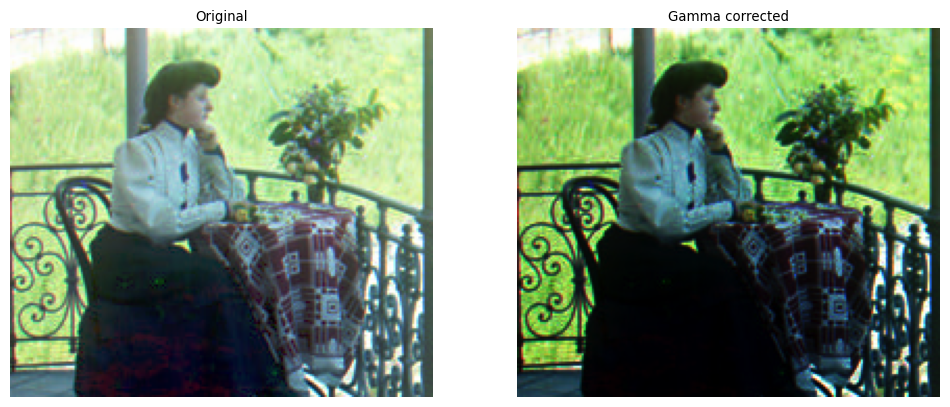

In [185]:
#Burada gamma >1 oldugundan koyulastirdi
gamma_corrected = exposure.adjust_gamma(image_eq, 2)
plot_comparison(image_eq, gamma_corrected, 'Gamma corrected')

### Laplacian Filter


Laplace filtresi görüntü iyileştirme filtresine ait lineer denklemin ikinci dereceden türevi olarak kenar tespitlerinde kullanılmaktadır. Laplace filtresi ile tek seferde görüntüde kenarlar tespit edilmiş olur.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


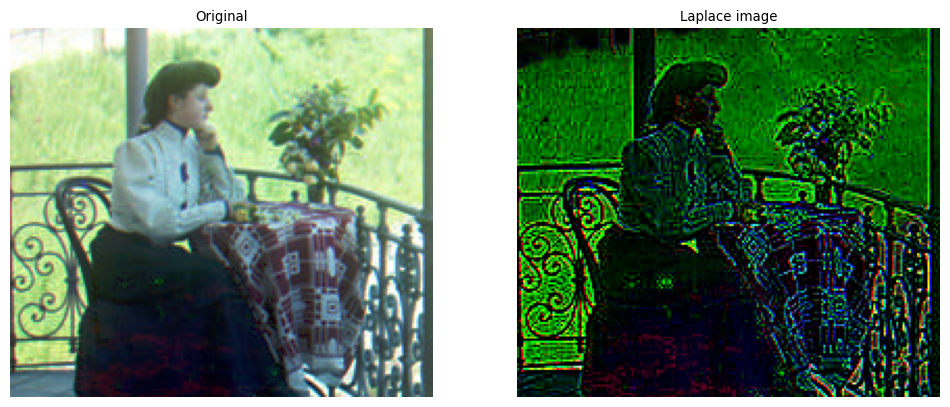

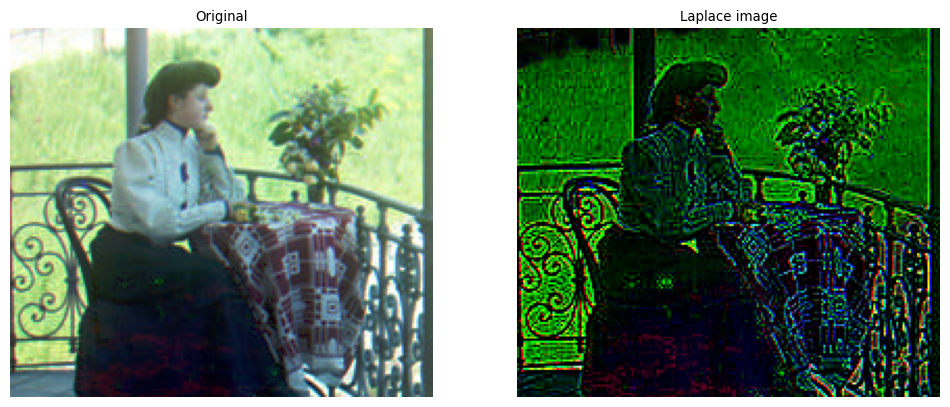

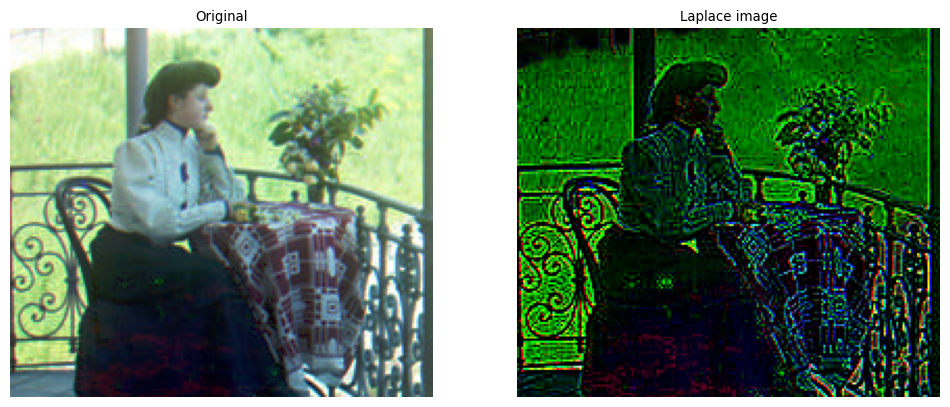

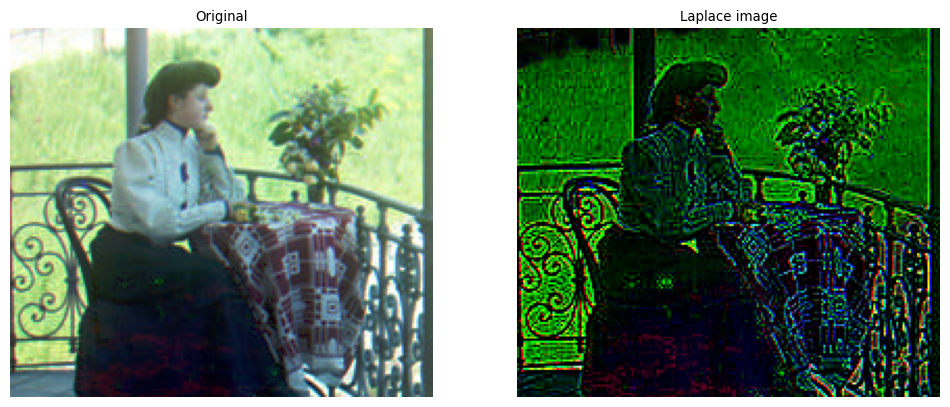

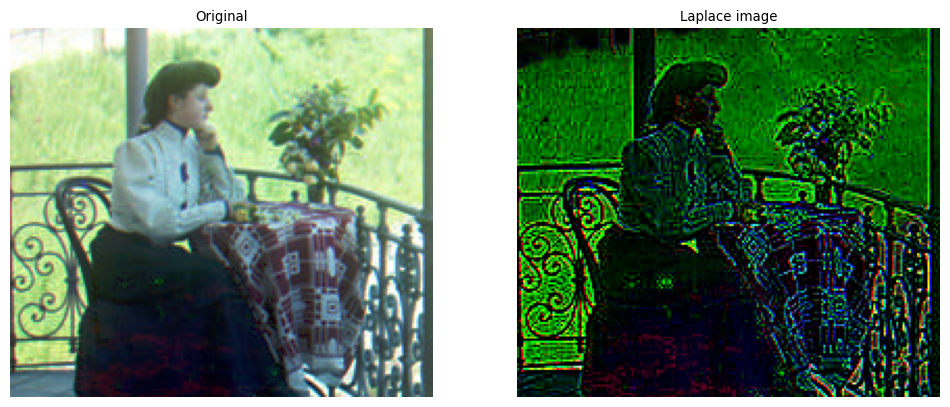

In [188]:
#Laplace görüntüyü keskileştirmek için 2. kez uygulandığında da kenar belirginleştirmek amacıyla uygulanır.
#Birinci defa farklı maske boyutlarında uyguladık ama iyi bir sonuç vermedi. 
#2 kez uygulanması da aynı şekilde iyi sonuç vermedi

from  skimage.filters import laplace
for kernel_size in range(3, 13, 2):
    image_laplace = laplace(image_adapted, ksize=kernel_size)
    plot_comparison(image_eq, image_laplace,  'Laplace image')

C:\Users\User\Miniconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  


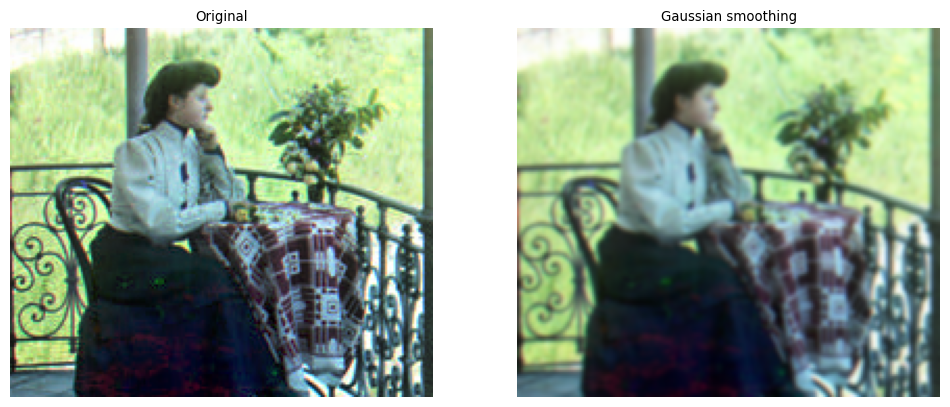

In [195]:
#gaussian smoothing

#noise ve detaydan kurtulmak icin blurlastırma yapıyor fakat fazla blurlastıma var goruntu ıyılesmedı

from skimage.filters import gaussian

#Apply gaussian edge detection filter
gaussian_image = gaussian(image_adapted, multichannel= True) #colored images set to be  multichannel = True

plot_comparison(image_adapted, gaussian_image, 'Gaussian smoothing')

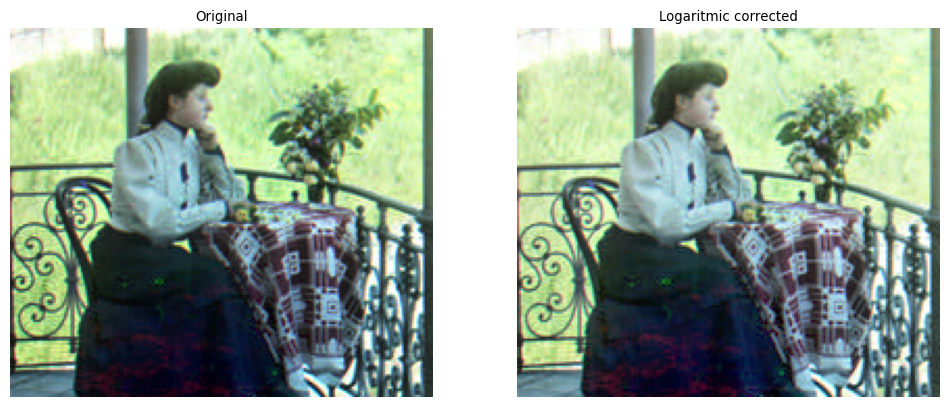

In [192]:
# Logarithmic
from skimage import exposure
logarithmic_corrected = exposure.adjust_log(image_adapted, 1)
plot_comparison(image_adapted, logarithmic_corrected, 'Logaritmic corrected')


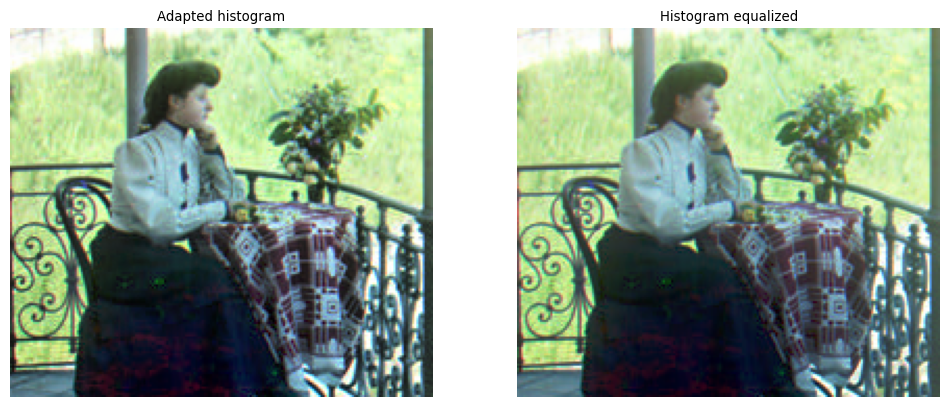

In [193]:
#En iyi sonucu Adapted histogram equalization ile elde ettik.
#Gamma veya logaritmic correctionlar resmi tekrar eski beyaz haline geri ceviriyor
#veya yuksek ustel degerler icin resmi koyu hale getiriyor

def plot_comparison2(original, filtered, original_title = 'Original',  title_filtered= 'filtered image'):
    
    fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize=(12,14), sharex = True, sharey = True)
    ax1.imshow(original, cmap = plt.cm.gray)
    ax1.set_title(original_title)
    ax1.axis('off')
    ax2.imshow(filtered, cmap = plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')



plot_comparison2(image_adapted, image_eq,'Adapted histogram', 'Histogram equalized')

